<a href="https://colab.research.google.com/github/ShivdasManwar01/Fake-News-Detection/blob/main/Rumour_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 **Rumour detection using LSTM Deep Learning**

*Library Imports*

In [ ]:

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import nltk
import re
from wordcloud import WordCloud

In [ ]:
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, LSTM, Conv1D, MaxPool1D
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score 

In [ ]:
fake = pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/Fake.csv')

In [ ]:
fake.head()

,title,text,subject,date
0,Donald Trump Sends Out Embarrassing New Year’...,Donald Trump just couldn t wish all Americans ...,News,"December 31, 2017"
1,Drunk Bragging Trump Staffer Started Russian ...,House Intelligence Committee Chairman Devin Nu...,News,"December 31, 2017"
2,Sheriff David Clarke Becomes An Internet Joke...,"On Friday, it was revealed that former Milwauk...",News,"December 30, 2017"
3,Trump Is So Obsessed He Even Has Obama’s Name...,"On Christmas day, Donald Trump announced that ...",News,"December 29, 2017"
4,Pope Francis Just Called Out Donald Trump Dur...,Pope Francis used his annual Christmas Day mes...,News,"December 25, 2017"


In [ ]:
fake.columns

Index(['title', 'text', 'subject', 'date'], dtype='object')

In [ ]:
fake['subject'].value_counts()

News               9050
politics           6841
left-news          4459
Government News    1570
US_News             783
Middle-east         778
Name: subject, dtype: int64

/usr/local/lib/python3.8/dist-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


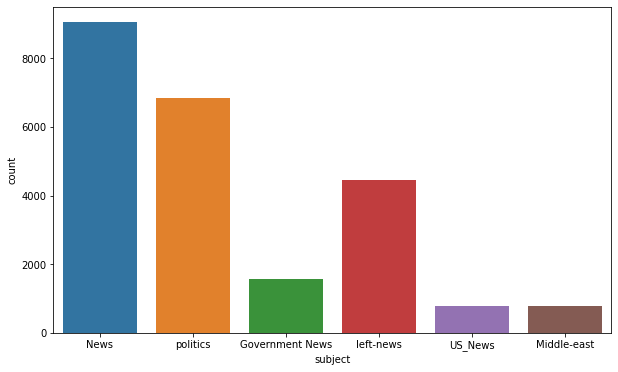

In [ ]:
plt.figure(figsize=(10,6))
sns.countplot('subject',data=fake)

##wordcloud

In [ ]:
text=' '.join(fake['text'].tolist())

<function matplotlib.pyplot.show(*args, **kw)>

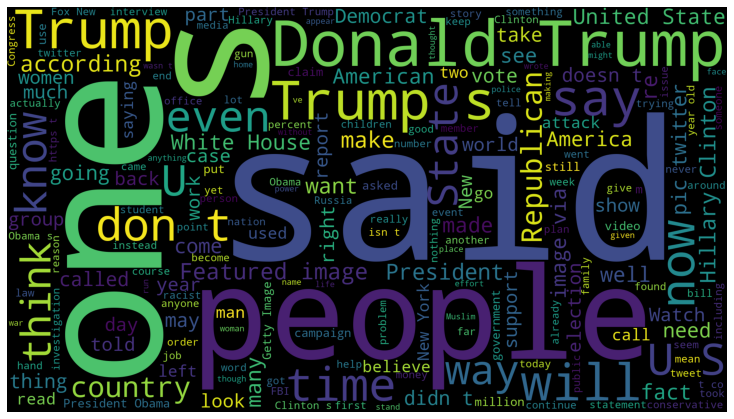

In [ ]:
wordcloud=WordCloud(width=1920,height=1080).generate(text)
fig=plt.figure(figsize=(10,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show


##Real News

In [ ]:
real=pd.read_csv('https://raw.githubusercontent.com/laxmimerit/fake-real-news-dataset/main/data/True.csv')

In [ ]:
text=' '.join(real['text'].tolist())

<function matplotlib.pyplot.show(*args, **kw)>

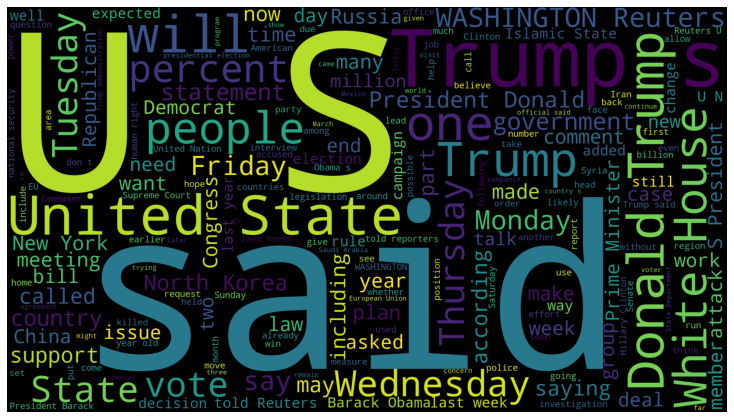

In [ ]:
wordcloud=WordCloud(width=1920,height=1080).generate(text)
fig=plt.figure(figsize=(10,20))
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.show

# Difference in real and fake news data
Real news seems to have source of publication which is not present in fake news set
Looking at the data:


*   Most of the text contains reuters information such as **"WASHINGTON(Reuters)"**
*   Some texts are tweets from twitter
*   Few text do not contain any publication info



# Data Cleaning Process
Removing reuters information or twitter twit information from the text
*    Text can be splitted only once at "-" which is always present after mentioning source of publication, this gives us publication part and text part.
*    If we do not get text part, this means publication details wasn't given for that record.
*    The twitter tweets always have some source, a long text of max 259 characters.

In [ ]:
real.sample(5)

,title,text,subject,date
21278,Exclusive: Bloomberg charity scrutinized by In...,NEW DELHI (Reuters) - India has been investiga...,worldnews,"August 29, 2017"
506,Top Democrats in Congress say won't meet with ...,WASHINGTON (Reuters) - The top two Democrats i...,politicsNews,"November 28, 2017"
17719,Iran still trying to buy items for missile dev...,BERLIN (Reuters) - German intelligence agencie...,worldnews,"October 11, 2017"
2664,"U.S., China disagreed on how to reduce U.S. tr...",WASHINGTON (Reuters) - Senior U.S. and Chinese...,politicsNews,"July 19, 2017"
15293,China's Xi: stable development of China-U.S. e...,BEIJING (Reuters) - Continued stable developme...,worldnews,"November 9, 2017"


In [ ]:
unknown_publishers=[]
for index,row in enumerate(real.text.values):
  try:
    record=row.split('-',maxsplit=1)
    record[1]
    assert(len(record[0])<120)
  except:
    unknown_publishers.append(index)

In [ ]:
len(unknown_publishers)

222

In [ ]:
real.iloc[unknown_publishers].text

7        The following statements were posted to the ve...
8        The following statements were posted to the ve...
12       The following statements were posted to the ve...
13       The following statements were posted to the ve...
14        (In Dec. 25 story, in second paragraph, corre...
                               ...                        
20135     (Story corrects to million from billion in pa...
20500     (This Sept 8 story corrects headline, clarifi...
20667     (Story refiles to add dropped word  not , in ...
21246     (Story corrects third paragraph to show Mosul...
21339     (Story corrects to fix spelling in paragraph ...
Name: text, Length: 222, dtype: object

In [ ]:
real.iloc[8970]

title      Graphic: Supreme Court roundup
text                                     
subject                      politicsNews
date                       June 16, 2016 
Name: 8970, dtype: object

In [ ]:
real=real.drop(8970,axis=0)

In [ ]:
publisher=[]
temp_text=[]


In [ ]:
for index,row in enumerate(real.text.values):
  if index in unknown_publishers:
    temp_text.append(row)
    publisher.append('Unknown')
  else:
    record=row.split('-',maxsplit=1)
    publisher.append(record[0].strip())
    temp_text.append(record[1].strip())


In [ ]:
real['publisher']=publisher
real['text']=temp_text

In [ ]:
real.head()

,title,text,subject,date,publisher
0,"As U.S. budget fight looms, Republicans flip t...",The head of a conservative Republican faction ...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
1,U.S. military to accept transgender recruits o...,Transgender people will be allowed for the fir...,politicsNews,"December 29, 2017",WASHINGTON (Reuters)
2,Senior U.S. Republican senator: 'Let Mr. Muell...,The special counsel investigation of links bet...,politicsNews,"December 31, 2017",WASHINGTON (Reuters)
3,FBI Russia probe helped by Australian diplomat...,Trump campaign adviser George Papadopoulos tol...,politicsNews,"December 30, 2017",WASHINGTON (Reuters)
4,Trump wants Postal Service to charge 'much mor...,President Donald Trump called on the U.S. Post...,politicsNews,"December 29, 2017",SEATTLE/WASHINGTON (Reuters)


In [ ]:
real.shape

(21416, 5)

In [ ]:
empty_fake_index=[index for index,text in enumerate(fake.text.tolist()) if str(text).strip()==""]

In [ ]:
fake.iloc[empty_fake_index]

,title,text,subject,date
10923,TAKE OUR POLL: Who Do You Think President Trum...,,politics,"May 10, 2017"
11041,Joe Scarborough BERATES Mika Brzezinski Over “...,,politics,"Apr 26, 2017"
11190,WATCH TUCKER CARLSON Scorch Sanctuary City May...,,politics,"Apr 6, 2017"
11225,MAYOR OF SANCTUARY CITY: Trump Trying To Make ...,,politics,"Apr 2, 2017"
11236,SHOCKER: Public School Turns Computer Lab Into...,,politics,"Apr 1, 2017"
...,...,...,...,...
21816,BALTIMORE BURNS: MARYLAND GOVERNOR BRINGS IN N...,,left-news,"Apr 27, 2015"
21826,FULL VIDEO: THE BLOCKBUSTER INVESTIGATION INTO...,,left-news,"Apr 25, 2015"
21827,(VIDEO) HILLARY CLINTON: RELIGIOUS BELIEFS MUS...,,left-news,"Apr 25, 2015"
21857,(VIDEO)ICE PROTECTING OBAMA: WON’T RELEASE NAM...,,left-news,"Apr 14, 2015"


In [ ]:
real['text']=real['title']+" "+real['text']
fake['text']=fake['title']+" "+fake['text']

In [ ]:
real['text']=real['text'].apply(lambda x:str(x).lower())
fake['text']=fake['text'].apply(lambda x:str(x).lower())

##Preprocessing of Data

In [ ]:
real['class']=1
fake['class']=0

In [ ]:
real.columns

Index(['title', 'text', 'subject', 'date', 'publisher', 'class'], dtype='object')

In [ ]:
real=real[['text','class']]

In [ ]:
fake=fake[['text','class']]

In [ ]:
data=real.append(fake,ignore_index=True)

In [ ]:
data.sample(5)

,text,class
33134,time traveler nancy pelosi says she just can’t...,0
7884,trump's body language during debate raises soc...,1
27829,"harry reid storms the senate, unleashes on go...",0
11520,merkel's conservatives tempt spd with offer on...,1
20319,brexit law passes hurdle in reprieve for briti...,1


In [ ]:
#To remove speacial characters from text data

!pip install spacy==2.2.3
!python -m spacy download en_core_web_sm
!pip install beautifulsoup4==4.9.1
!pip install textblob==0.15.3
!pip install git+https://github.com/laxmimerit/preprocess_kgptalkie.git --upgrade --force-reinstall

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.3/10.3 MB 78.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.7/3.7 MB 71.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.1/211.1 KB 23.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 81.3 MB/s eta 0:00:00
  Attempting uninstall: srsly
    Found existing installation: srsly 2.4.5
    Uninstalling srsly-2.4.5:
      Successfully uninstalled srsly-2.4.5
  Attempting uninstall: catalogue
    Found existing installation: catalogue 2.0.8
    Uninstalling catalogue-2.0.8:
      Successfully uninstalled catalogue-2.0.8
  Attempting uninstall: blis
    Found existing installation: blis 0.7.9
    Uninstalling blis-0.7.9:
      Successfully uninstalled blis-0.7.9
  Attempting uninstall: thinc
    Found existing installation: thinc 8.1.7
    Uninstalling thinc-8.1.7:
      Successfully u

In [ ]:
import preprocess_kgptalkie as ps


In [ ]:
data['text']=data['text'].apply(lambda x: ps.remove_special_chars(x))
data['text'] = [str (item) for item in data['text']]

In [ ]:
data.head();

In [ ]:
#Vectorization--word2vec

In [ ]:
import gensim

In [ ]:
y=data['class'].values

In [ ]:
X=[d.split() for d in data['text'].tolist()]


In [ ]:
type(X[0])

list

In [ ]:
print(X[0])

['as', 'us', 'budget', 'fight', 'looms', 'republicans', 'flip', 'their', 'fiscal', 'script', 'the', 'head', 'of', 'a', 'conservative', 'republican', 'faction', 'in', 'the', 'us', 'congress', 'who', 'voted', 'this', 'month', 'for', 'a', 'huge', 'expansion', 'of', 'the', 'national', 'debt', 'to', 'pay', 'for', 'tax', 'cuts', 'called', 'himself', 'a', 'fiscal', 'conservative', 'on', 'sunday', 'and', 'urged', 'budget', 'restraint', 'in', '2018', 'in', 'keeping', 'with', 'a', 'sharp', 'pivot', 'under', 'way', 'among', 'republicans', 'us', 'representative', 'mark', 'meadows', 'speaking', 'on', 'cbs', 'face', 'the', 'nation', 'drew', 'a', 'hard', 'line', 'on', 'federal', 'spending', 'which', 'lawmakers', 'are', 'bracing', 'to', 'do', 'battle', 'over', 'in', 'january', 'when', 'they', 'return', 'from', 'the', 'holidays', 'on', 'wednesday', 'lawmakers', 'will', 'begin', 'trying', 'to', 'pass', 'a', 'federal', 'budget', 'in', 'a', 'fight', 'likely', 'to', 'be', 'linked', 'to', 'other', 'issues',

In [ ]:
DIM=100
w2v_model=gensim.models.Word2Vec(sentences=X,size=DIM,window=10,min_count=1)

In [ ]:
w2v_model.wv.vocab

{'as': <gensim.models.keyedvectors.Vocab at 0x7f347240fb80>,
 'us': <gensim.models.keyedvectors.Vocab at 0x7f347240f640>,
 'budget': <gensim.models.keyedvectors.Vocab at 0x7f347240f460>,
 'fight': <gensim.models.keyedvectors.Vocab at 0x7f347240faf0>,
 'looms': <gensim.models.keyedvectors.Vocab at 0x7f347240fc10>,
 'republicans': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb340>,
 'flip': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb490>,
 'their': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb4f0>,
 'fiscal': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb580>,
 'script': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb5e0>,
 'the': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb310>,
 'head': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb670>,
 'of': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb6d0>,
 'a': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb730>,
 'conservative': <gensim.models.keyedvectors.Vocab at 0x7f33c6abb790>,
 'republican': <gensim.models.keyedvector

In [ ]:
w2v_model.wv['looms']

array([ 2.6875535e-01, -5.3156012e-01,  9.4286196e-02,  3.0964118e-04,
        5.9409548e-02,  2.0108510e-02,  1.7567262e-01,  6.3548408e-02,
        4.8180255e-01, -2.1750789e-02,  3.6273992e-01, -2.3350142e-01,
        5.4828191e-01, -9.5384836e-02,  2.9224329e-02, -4.8386583e-01,
        5.4820794e-01, -2.2235486e-01, -2.1196914e-01,  3.4714356e-01,
       -5.1941866e-01,  5.0224620e-01,  1.3424566e-01,  2.4388470e-01,
       -2.6667434e-01,  6.8226926e-02, -1.2438604e-01,  4.0264748e-02,
       -3.8151392e-01,  2.1886879e-01, -6.1100292e-01,  5.2758801e-01,
       -2.1628003e-01,  4.9072376e-01, -1.3177006e-01, -1.6578253e-01,
        7.7267075e-01,  4.7982845e-02,  2.7780753e-01,  5.6868625e-01,
       -2.2019178e-01,  2.4762209e-01,  3.6728081e-01,  2.8157842e-01,
       -3.9807320e-01, -5.6747671e-02,  4.4602085e-02,  3.4133232e-01,
       -5.8893085e-01, -5.9066248e-01,  6.2426633e-01,  4.2498219e-01,
       -3.1844863e-01,  3.3132738e-01, -2.3723659e-01,  3.6851138e-02,
      

In [ ]:
w2v_model.wv['india']

array([-0.7193376 , -1.5666016 , -0.06413732,  0.6292494 ,  0.94672436,
       -1.249708  , -0.6290466 ,  0.13408536, -0.46138233, -0.90606874,
        0.88593155,  1.6456069 ,  3.7926402 ,  2.0874114 , -0.4576875 ,
        3.4430332 ,  1.138844  ,  0.798872  , -0.32749516,  0.09552003,
        2.305428  , -2.4096231 ,  3.9045978 ,  3.415247  ,  2.7109907 ,
        0.43489859, -1.011486  ,  1.2753329 ,  2.609554  , -2.047085  ,
       -2.106797  , -0.14573823,  2.673325  ,  0.1295231 ,  3.1416864 ,
       -1.6753638 ,  2.2952392 ,  0.6206772 ,  1.319428  , -3.2322176 ,
        3.7309468 , -1.5159497 ,  0.09547323,  1.3209715 , -2.0256925 ,
       -0.959351  , -1.1018581 , -0.31425327,  0.6663296 ,  0.5281415 ,
        1.4264305 ,  0.98247075, -0.7635182 ,  0.69346553, -0.70426345,
        1.4571705 ,  0.14242865, -0.43324146, -0.4281532 ,  0.5561515 ,
       -1.2487547 , -2.04655   ,  2.2959733 ,  0.35097533, -2.4241395 ,
       -0.83085847, -0.13672893,  0.9204511 ,  0.5918323 , -3.78

In [ ]:
w2v_model.wv.most_similar('india')

[('pakistan', 0.7158052325248718),
 ('malaysia', 0.7083698511123657),
 ('indian', 0.6698184013366699),
 ('beijings', 0.6568145155906677),
 ('china', 0.6543031930923462),
 ('thailand', 0.639003574848175),
 ('norway', 0.6218666434288025),
 ('australia', 0.6208340525627136),
 ('philippines', 0.6156084537506104),
 ('indonesia', 0.6134334802627563)]

In [ ]:
w2v_model.wv.most_similar('us')

[('american', 0.5622043013572693),
 ('iranian', 0.4822497069835663),
 ('iran', 0.48176485300064087),
 ('washingtons', 0.47631871700286865),
 ('cretz', 0.46342411637306213),
 ('obamainstead', 0.4594264626502991),
 ('tightenun', 0.4546593129634857),
 ('nato', 0.4456263482570648),
 ('countrys', 0.43489503860473633),
 ('reinterpreted', 0.4334607422351837)]

In [ ]:
w2v_model.wv.most_similar('china')

[('beijing', 0.847733736038208),
 ('taiwan', 0.8060479164123535),
 ('chinas', 0.7594298124313354),
 ('chinese', 0.7084647417068481),
 ('japan', 0.6796890497207642),
 ('pyongyang', 0.67151939868927),
 ('beijings', 0.6564250588417053),
 ('india', 0.6543031334877014),
 ('waterway', 0.6478677988052368),
 ('xi', 0.6339658498764038)]

In [ ]:
tokenizer=Tokenizer()
tokenizer.fit_on_texts(X)

In [ ]:
X = tokenizer.texts_to_sequences(X)

In [ ]:
X

[[18,
  30,
  473,
  480,
  10668,
  133,
  8088,
  40,
  1375,
  5171,
  1,
  419,
  3,
  4,
  301,
  79,
  6312,
  6,
  1,
  30,
  189,
  29,
  773,
  26,
  279,
  9,
  4,
  1107,
  2956,
  3,
  1,
  124,
  954,
  2,
  447,
  9,
  184,
  1193,
  173,
  393,
  4,
  1375,
  301,
  8,
  342,
  5,
  1110,
  473,
  7805,
  6,
  1188,
  6,
  1764,
  16,
  4,
  3407,
  7895,
  141,
  164,
  320,
  133,
  30,
  798,
  922,
  7806,
  675,
  8,
  2010,
  476,
  1,
  383,
  1761,
  4,
  559,
  589,
  8,
  168,
  691,
  50,
  408,
  28,
  17340,
  2,
  89,
  1352,
  65,
  6,
  410,
  60,
  32,
  776,
  25,
  1,
  8089,
  8,
  203,
  408,
  39,
  1438,
  350,
  2,
  929,
  4,
  168,
  473,
  6,
  4,
  480,
  304,
  2,
  22,
  1957,
  2,
  80,
  426,
  170,
  18,
  312,
  208,
  107,
  18,
  1,
  515,
  570,
  96,
  1781,
  1504,
  6,
  50,
  133,
  39,
  1072,
  2,
  377,
  349,
  3,
  189,
  37,
  68,
  14,
  5,
  19,
  133,
  182,
  4,
  379,
  473,
  959,
  6,
  169,
  691,
  110,
  196,
  62,

In [ ]:
#tokenizer.word_index

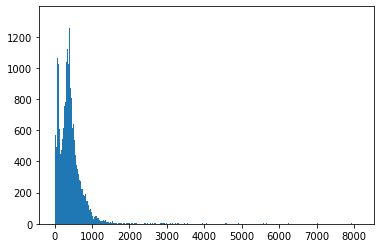

In [ ]:
plt.hist([len(x) for x in X],bins=700)
plt.show()

In [ ]:
nos=np.array([len(x) for x in X])
len(nos[nos>1000])

1581

In [ ]:
maxlen=1000
X=pad_sequences(X,maxlen=maxlen)

In [ ]:
len(X[0])

1000

In [ ]:
vocab_size=len(tokenizer.word_index)+1
vocab=tokenizer.word_index

In [ ]:
def get_weight_matrix(model):
   weight_matrix=np.zeros((vocab_size,DIM))
   for word, i in vocab.items():
     weight_matrix[i]=model.wv[word]
   return weight_matrix

In [ ]:
embedding_vectors=get_weight_matrix(w2v_model)

In [ ]:
embedding_vectors.shape

(231873, 100)

In [ ]:
model=Sequential()
model.add(Embedding(vocab_size,output_dim=DIM,weights=[embedding_vectors],input_length=maxlen,trainable=False))
model.add(LSTM(units=128))
model.add(Dense(1,activation='sigmoid'))
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['acc'])

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 1000, 100)         23187300  
                                                                 
 lstm (LSTM)                 (None, 128)               117248    
                                                                 
 dense (Dense)               (None, 1)                 129       
                                                                 
Total params: 23,304,677
Trainable params: 117,377
Non-trainable params: 23,187,300
_________________________________________________________________


In [ ]:
X_train,X_test,y_train,y_test=train_test_split(X,y)


In [ ]:
model.fit(X_train,y_train,validation_split=0.3,epochs=6)

Epoch 1/6
737/737 [==============================] - 51s 59ms/step - loss: 0.1408 - acc: 0.9490 - val_loss: 0.1733 - val_acc: 0.9285
Epoch 2/6
737/737 [==============================] - 42s 58ms/step - loss: 0.0759 - acc: 0.9746 - val_loss: 0.0488 - val_acc: 0.9835
Epoch 3/6
737/737 [==============================] - 44s 59ms/step - loss: 0.0327 - acc: 0.9892 - val_loss: 0.0320 - val_acc: 0.9902
Epoch 4/6
737/737 [==============================] - 43s 59ms/step - loss: 0.0408 - acc: 0.9861 - val_loss: 0.0339 - val_acc: 0.9878
Epoch 5/6
737/737 [==============================] - 43s 59ms/step - loss: 0.0199 - acc: 0.9936 - val_loss: 0.0230 - val_acc: 0.9911
Epoch 6/6
737/737 [==============================] - 42s 58ms/step - loss: 0.0093 - acc: 0.9972 - val_loss: 0.0218 - val_acc: 0.9931


In [ ]:
y_pred=(model.predict(X_test)>=0.5).astype(int)

351/351 [==============================] - 8s 22ms/step


In [ ]:
accuracy_score(y_test,y_pred)

0.9934075723830735

In [ ]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.99      1.00      0.99      5824
           1       1.00      0.99      0.99      5401

    accuracy                           0.99     11225
   macro avg       0.99      0.99      0.99     11225
weighted avg       0.99      0.99      0.99     11225



In [ ]:
#Testing with real life news
x=['Actor Shah Rukh Khan was killed while shooting for a film']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)


In [ ]:
(model.predict(x)>=0.5).astype(int)

1/1 [==============================] - 0s 50ms/step


array([[0]])

In [ ]:
x=['India saw a single-day rise of 94 new coronavirus infections, with the active cases declining to 1,934, according to the Union Health Ministry data updated on Monday.']
x=tokenizer.texts_to_sequences(x)
x=pad_sequences(x,maxlen=maxlen)

In [ ]:
(model.predict(x)>=0.5).astype(int)

1/1 [==============================] - 0s 52ms/step


array([[1]])